 # Assignment-2: Solution
 
 ### Working with large tables
 
 **Q1.** You are given a multicolumn table named "**sfr_mass.fits**" which lists some properties of about 300,000 galaxies under each column. These properties are: 

 1. Position of galaxies in the sky (in columns ra and dec)
 2. Log of stellar mass of each galaxy in solar mass units (in column named logM)
 3. Star formation rate (SFR) which is the rate at which a galaxy forms stars in units of solar mass / yr (in the column logSFR)

#### _If you create a logSFR vs logM scatter plot, it will look something like this_: 



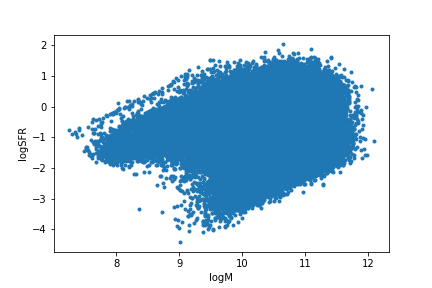

#### However there are some key details hidden in this plot that we will try to uncover. You are required to do the following:  

**a)** Instead of a simple scatter plot, **make a contour plot** of your data points in this plane of logSFR versus logM. Do you notice any features? If you have done everything correctly, then you will observe a twin peak or bimodal distrubution of galaxies in this plane. 

**b)** Now **compute the specific star formation rate (sSFR)** of each galaxy which is equal to SFR/Stellar_mass. Since this will be a large number, compute the log(sSFR). In astronomy, we always use base 10 while taking logs. 

**c)** Next, repeat the **exercise a) but now with logSFR replaced by logsSFR**. Do you notice anything different? Finally, plot a normalised histogram of logsSFR and check if you are getting a bimodal distribution. 

**d)** Astronomers classify galaxies based on the position of each galaxy relative to three distinct regions in the logsSFR vs logM plot. They are:- 

 **Star forming galaxies : these have logsSFR >= -10.8**
 
 **Passive galaxies: with log sSFR<=-11.8**
 
 **Green valley:  within -11.8 < log sSFR <-10.8**

**e)** **Find the percentage of these three kinds of galaxies in your sample.** Now, take only star forming galaxies (use np.where() to select them) and plot them on the logSFR vs logM plane. They roughly form a linear sequence. Fit a straight line to these points which will give you a **relation between SFR and stellar mass for these galaxies**. Also **find galaxies deviating from this relation at 3-sigma level** and display them on the same plot. 


**f)** As a final step, add logsSFR as a new column to the existing table and save it in your favourite format. 

###  -----------------------------------------------------------------------------------------------------------------------

In [1]:
# Q.1 

# First we read the table and define the columns. 

import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
from astropy.table import QTable, Table, Column

t = Table.read("sfr_mass.fits", format="fits")
logM = t["logM"]
logSFR = t["logSFR"]


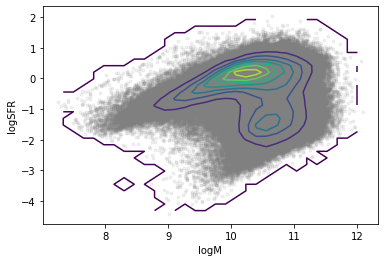

In [2]:
# 1(a)

# We will use plt.contour to make the required plot. For "z" axis, we will use counts from 2dhistorgram of M & SFR

counts, xedges, yedges = np.histogram2d(logM,logSFR, bins=30)

xcenters = (xedges[:-1] + xedges[1:]) / 2          
ycenters = (yedges[:-1] + yedges[1:]) / 2

x,y = np.meshgrid(xcenters,ycenters)

plt.contour(x,y,counts.transpose())
plt.scatter(logM,logSFR,marker=".", alpha=0.1, color='gray')

plt.xlabel("logM")
plt.ylabel("logSFR")
plt.show()

In [3]:
# 1(b)

# computing logsSFR for all galaxies is very simple, just do: 

logsSFR = logSFR-logM

# 1(c)

# for making contour plots proceed like before. 

counts, xedges, yedges = np.histogram2d(logM,logsSFR, bins=50)

xcenters = (xedges[:-1] + xedges[1:]) / 2          
ycenters = (yedges[:-1] + yedges[1:]) / 2

print(xedges)
print(xedges[:-1])
print(xedges[1:])

[ 7.25400019  7.35066018  7.44732018  7.54398017  7.64064016  7.73730016
  7.83396015  7.93062015  8.02728014  8.12394013  8.22060013  8.31726012
  8.41392012  8.51058011  8.6072401   8.7039001   8.80056009  8.89722009
  8.99388008  9.09054008  9.18720007  9.28386006  9.38052006  9.47718005
  9.57384005  9.67050004  9.76716003  9.86382003  9.96048002 10.05714002
 10.15380001 10.25046    10.34712    10.44377999 10.54043999 10.63709998
 10.73375998 10.83041997 10.92707996 11.02373996 11.12039995 11.21705995
 11.31371994 11.41037993 11.50703993 11.60369992 11.70035992 11.79701991
 11.8936799  11.9903399  12.08699989]
[ 7.25400019  7.35066018  7.44732018  7.54398017  7.64064016  7.73730016
  7.83396015  7.93062015  8.02728014  8.12394013  8.22060013  8.31726012
  8.41392012  8.51058011  8.6072401   8.7039001   8.80056009  8.89722009
  8.99388008  9.09054008  9.18720007  9.28386006  9.38052006  9.47718005
  9.57384005  9.67050004  9.76716003  9.86382003  9.96048002 10.05714002
 10.15380001 

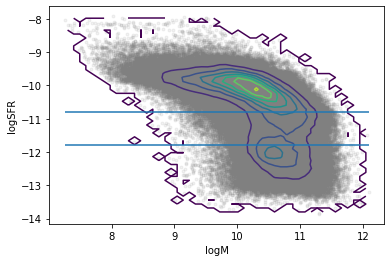

In [4]:
x,y = np.meshgrid(xcenters,ycenters)

plt.contour(x,y,counts.transpose())

plt.scatter(logM,logsSFR,marker=".", alpha=0.1, color='gray')
plt.hlines(-10.8, np.min(logM),np.max(logM))
plt.hlines(-11.8, np.min(logM),np.max(logM))
plt.xlabel("logM")
plt.ylabel("logSFR")
plt.show()

# I have also over plotted two lines logsSFR = -10.8 and logsSFR = -11.8. Notice this encloses the "valley" region.

In [5]:
# 1 (d),(e)

# pick galaxies residing in diferent regioins. We do this by using np.where()

sf = np.where(logsSFR>=-10.8)
gv = np.where((logsSFR>-11.8) & (logsSFR<-10.8))
pas = np.where(logsSFR<=-11.8)

# number of galaxies in each category is just the length of each array. 

print("total number of galaxies:",len(logM))
print("number of star forming galaxies:",len(logM[sf]))
print("number of green valley galaxies:",len(logSFR[gv]))
print("number of passive galaxies:",len(logsSFR[pas]))

total number of galaxies: 309943
number of star forming galaxies: 188944
number of green valley galaxies: 61151
number of passive galaxies: 59848


-6.151873123658119 0.6110778290403002


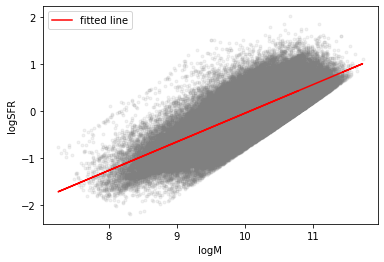

In [6]:
# 1(e)

# We pick only sf galaxies first. 

logM_sf = logM[sf]
logSFR_sf = logSFR[sf]

# We fit a straight line by using stats.linregress. 

from scipy import stats

line = stats.linregress(logM_sf, logSFR_sf)       # fitting done in this step. 
print(line.intercept, line.slope)

plt.scatter(logM_sf,logSFR_sf,marker=".", alpha=0.1, color='gray')
#plt.hist2d(logM_sf,logSFR_sf, bins=50)

plt.plot(logM_sf, line.intercept + line.slope*logM_sf, 'r', label='fitted line') # plot the best fit line
plt.legend()
plt.xlabel("logM")
plt.ylabel("logSFR")

#plt.colorbar()
plt.show()



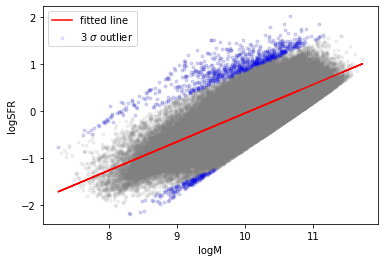

In [7]:
# 1 (e)

# to find scatter around best fit, we find the residue. 

res = logSFR_sf - (line.intercept + line.slope*logM_sf)

# one sigma scatter is given by : 
sigma = np.std(res)
outliers = np.where(abs(res)>3*sigma)                            # |res|>3*sigma

# Lets show the outliers.

plt.scatter(logM_sf,logSFR_sf,marker=".", alpha=0.1, color='gray')
plt.scatter(logM_sf[outliers],logSFR_sf[outliers],marker=".", alpha=0.1, color='blue', label="3 $\sigma$ outlier")
plt.plot(logM_sf, line.intercept + line.slope*logM_sf, 'r', label='fitted line') # plot the best fit line
plt.legend()
plt.xlabel("logM")
plt.ylabel("logSFR")

plt.legend()
plt.show()



In [8]:
# 1 (f)

# add sSFR column using "add_column()" function

t.add_column(logsSFR, name='logsSFR')
t.write("sfr_mass_sSFR.fits", format="fits", overwrite=True)


In [9]:
# display the new table.
t

ra,dec,logM,logSFR,logsSFR
float64,float64,float32,float32,float32
224.49908,41.837837,10.775,0.529,-10.245999
214.71149,11.28879,9.863,-0.283,-10.146
190.90265,27.891935,10.8,0.064,-10.736
43.210108,-7.915026,10.921,-1.276,-12.197
202.85849,11.092231,10.296,0.23,-10.066
215.48506,1.939695,10.326,0.577,-9.749001
239.70401,3.962088,10.248,-0.197,-10.445
216.13378,34.770565,10.232,0.075,-10.157001
173.85863,12.950055,10.417,0.344,-10.073


**Q2.** You are given another table "morph.fits" which contains information about 14,000 galaxies. This table lists the sky positions (ra & dec) and morphological T-types of galaxies. The T-type index tells you about the visual appearence of a galaxy. If you are unfamiliar to this, you may want to look at wikipedia page of "Galaxy Morphological Classification" before you proceed. But for our purpose, you may treat this column as a set of labels assigned to each galaxy. 

#### In this problem you are required to do the following: 

**a)** Find common galaxies between this table and the table in previous question. You will need to join the two tables using join_skycoord() of astropy. For this problem, any source within 1 arcsec should be counted  as a match. 

**b)** We will define two categories of galaxies based on their T-type:- 

**Early types: with T-type<=0**

**Late types: with T-type>=1**

Typical examples of early and late-type galaxies are shown below: 

#### Early Type
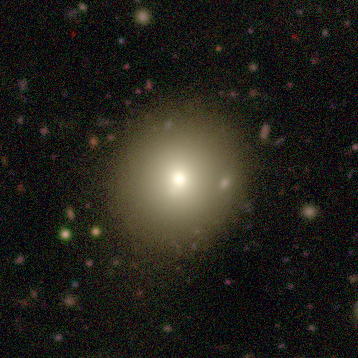

#### Late Type
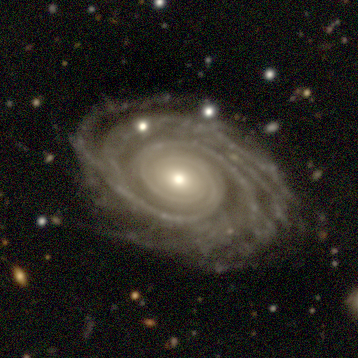

Find the fraction of early and late types galaxies in your matched table. 

**c)** Now bin your galaxies in log stellar mass, you may choose the bin width to be anywhere in the range 0.3-0.5 dex. Now plot the fraction of early and late type galaxies as function of log stellar mass. 

**_Hint: use np.histogram()for binning. Define early and late type subsamples using np.where(). Use same binning schemes for early and late type galaxies so that you get arrays of same size. This will help you to compute the fractions without hassles. Rest questions are just about different subsamples but require similar method._** 

**d)** Repeat **c)** above but now separating galaxies into star-forming, green valley and passive category. 

**e)** Now form a subsample by selecting only star-forming galaxies from your matched table. What is the fraction of late-type galaxies in this sub sample? Plot a histogram of this fraction with log stellar mass.  

**f)** Repeat above exercise for the other two subsamples of green valley and passive galaxies. 


In [10]:
# 1(a)

from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.table import join_skycoord
from astropy import table

# first read the tables. 

t1 = Table.read("sfr_mass_sSFR.fits", format="fits")
t2 = Table.read("morph.fits", format="fits")

# Use SkyCoords to create columns from each table which will be used to cross match. 

sc1 = SkyCoord(t1["ra"], t1["dec"], unit='deg')
sc2 = SkyCoord(t2["ra"], t2["dec"], unit='deg')

# A new table object by selecting relevant columns. 

T1 = Table([sc1, t1["logM"], t1["logSFR"], t1["logsSFR"]], names=['sc', 'logM', "logSFR","logsSFR"])
T2 = Table([sc2, t2["TType"]], names=['sc', 'TType'])

# Perform an inner join. 

T12 = table.join(T1, T2, join_type='inner', join_funcs={'sc': join_skycoord(1 * u.arcsec)})

# Display the joined table

T12

sc_id,sc_1,logM,logSFR,logsSFR,sc_2,TType
,"deg,deg",,,,"deg,deg",
int64,object,float32,float32,float32,object,int16
1,"212.13658,3.024297",9.709,-0.468,-10.177,"212.1365833333333,3.024319444444444",5
2,"137.03801,31.73469",11.16,-0.721,-11.881,"137.0379583333333,31.734686111111106",-5
3,"220.85597,58.887675",10.546,0.682,-9.863999,"220.85591666666664,58.88774444444444",5
4,"246.07753,36.923174",10.498,-1.961,-12.459,"246.07749999999996,36.923161111111106",-2
5,"234.18148,3.815623",11.075,0.029,-11.046,"234.1814583333333,3.815655555555555",0
6,"205.05238,2.480124",11.083,-0.389,-11.472,"205.05237499999998,2.480122222222222",3
7,"131.15848,55.018924",11.113,-1.055,-12.168,"131.15837499999998,55.01899999999999",-5
8,"143.80927,34.731677",11.078,-0.935,-12.0130005,"143.80925,34.73166944444444",0


In [11]:
#1(b)

# define relevant columns. 

logsSFR = T12["logsSFR"]
logM = T12["logM"]
TType = T12["TType"]

# form subsets of etg and ltg using np.where()

etg = np.where(TType<=0)
ltg = np.where(TType>=1)

# compute fraction. 

print("early type fraction: ", len(logM[etg])/len(logM))
print("late type fraction: ", len(logM[ltg])/len(logM))

early type fraction:  0.45177705977382876
late type fraction:  0.5482229402261712


In [12]:
#1(c) 

# I will find minimum and maximum limit of logM 

print(np.min(logM), np.max(logM))

# Will use this limit to define bins

binarray = np.linspace(np.min(logM),np.max(logM),11)    # bin edges are defined
bin_centre = (binarray[:-1] + binarray[1:]) / 2         # bin centres are defined
bin_width = (binarray[1]-binarray[0])                   # bin width is differece between subsequent elements

print("binarray :",binarray)
print("bin centre :",bin_centre)
print("bind width:", bin_width)

7.412 12.087
binarray : [ 7.41200018  7.87950015  8.34700012  8.81450009  9.28200006  9.74950004
 10.21700001 10.68449998 11.15199995 11.61949992 12.08699989]
bin centre : [ 7.64575016  8.11325014  8.58075011  9.04825008  9.51575005  9.98325002
 10.45074999 10.91824996 11.38574994 11.85324991]
bind width: 0.4674999713897705


In [13]:
# use np.histogram to count number of galaxies in each of above defined bins. 

allcounts, allbinedges = np.histogram(logM,bins=binarray)
etgcounts, etgbinedges = np.histogram(logM[etg],bins=binarray)
ltgcounts, ltgbinedges = np.histogram(logM[ltg],bins=binarray)

print(allcounts)
print(etgcounts)
print(ltgcounts)

[   1    2   16  137  464 1318 3231 4839 2252  120]
[   0    1   10   29   78  298 1209 2389 1468  111]
[   1    1    6  108  386 1020 2022 2450  784    9]


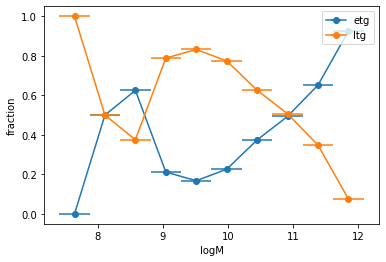

In [14]:
# define the fractions

etg_frac = etgcounts/allcounts
ltg_frac = ltgcounts/allcounts

# plot the fractions

plt.errorbar(bin_centre, etg_frac, xerr = bin_width/2, fmt = '-o', label="etg")
plt.errorbar(bin_centre, ltg_frac, xerr = bin_width/2, fmt = '-o', label="ltg")
plt.legend(loc ='upper right')
plt.xlabel("logM")
plt.ylabel("fraction")

plt.show()

# fraction of early and late types galaxies as function of logM : 

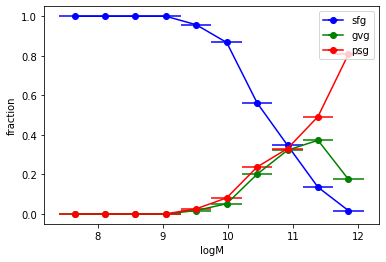

In [15]:
# repeat above, but now separate galaxies into star forming, green valley and passive: 

sfg = np.where(logsSFR>=-10.8)
psg = np.where(logsSFR<=-11.8)
gvg = np.where((logsSFR>-11.8) & (logsSFR<-10.8))


sfgcounts, sfgbinedges = np.histogram(logM[sfg],bins=binarray)
psgcounts, psgbinedges = np.histogram(logM[psg],bins=binarray)
gvgcounts, gvgbinedges = np.histogram(logM[gvg],bins=binarray)

sfg_frac = sfgcounts/allcounts
psg_frac = psgcounts/allcounts
gvg_frac = gvgcounts/allcounts

plt.errorbar(bin_centre, sfg_frac, xerr = bin_width/2, fmt = '-o', label="sfg", color="blue")
plt.errorbar(bin_centre, gvg_frac, xerr = bin_width/2, fmt = '-o', label="gvg", color="green")
plt.errorbar(bin_centre, psg_frac, xerr = bin_width/2, fmt = '-o', label="psg", color="red")
plt.legend(loc ='upper right')
plt.xlabel("logM")
plt.ylabel("fraction")

plt.show()

fraction of late type : 0.8621187511279552


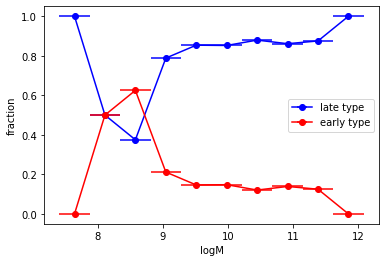

In [16]:
# we can find fraction of late types in starforming galaxies in similar manner. 

# pick only star forming galaxies 
#--------------------------------
logM_sf = logM[sfg]
TType_sf = TType[sfg]
#--------------------------------

# rest proceed as previously. 

late = np.where(TType_sf>=1)
print("fraction of late type :", len(logM_sf[late])/len(logM_sf))


# I have kept the same bins. 

all_sf_counts, all_sf_binedges = np.histogram(logM_sf,bins=binarray)
late_sf_counts, late_sf_binedges = np.histogram(logM_sf[late],bins=binarray)

fract_late_sf = late_sf_counts/all_sf_counts

plt.errorbar(bin_centre, fract_late_sf, xerr = bin_width/2, fmt = '-o', label="late type", color="blue")
plt.errorbar(bin_centre, 1-fract_late_sf, xerr = bin_width/2, fmt = '-o', label="early type", color="red")
plt.legend()
plt.xlabel("logM")
plt.ylabel("fraction")

plt.show()


# You can similarly do it for others. 
# For eg to get the same result for passive galaxies change logm[sf]-->logM[pas]

## Fitting a mock spectrum

### _This question closely follows the material taught in lecture 10 on model fitting. You can refer to the video and try same sequence of steps. Only difference is that we now have two gaussians, one with positive and one with negative amplitude._


**Q3.** You are given a spectrum in a fits table **"spectrum.fits"**. It contains two columns: wavelength and flux, both in arbitraty units. A Plot of flux vs wavelength will look something like this:

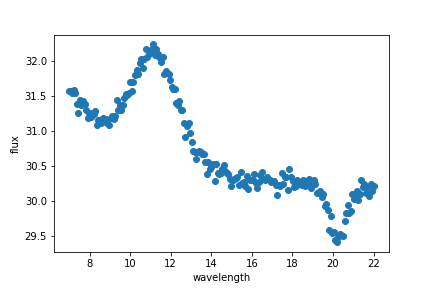

This is our mock spectrum for some astrophysical object which contains an emission and absorption line. You are also told that the mean wavelength of these two lines differ by exactly 9 units. 

**Now you are required to do the following:** 

**a)** You need to fit this spectrum with a model which will enable you to determine wavelength and spread of these two lines. 

**b)** Plot your model and the data on same graph to visually display the "goodness of fit" of your model.

**c)** Now display the residual flux = flux-model_flux, as function of wavelength. If your model is good the residual flux will be randomly scattered around a mean value of zero. 


**Hint:** Your model does not need to be a single function. You are allowed make a composite model by combining different available models in astropy.modeling module. For example, you can think of combining a second degree polynomial with gaussians to construct your model.

In [17]:
# We will closely follow the steps shown in lecture 10

from astropy.modeling import models

# read the table and store columns as numpy arrays. 

spec_table = Table.read("spectrum.fits", format="fits")
w = spec_table["wavelength,"]
f = spec_table["flux"]

# For model we choose two gaussians + 2nd degree polynomial. 
# Suppply it with suitable guess values. 

model_1 = models.Gaussian1D(amplitude=2, mean=11, stddev=1)+models.Gaussian1D(amplitude=-1.0, mean=20, stddev=0.5)

model_2 = models.Polynomial1D(degree=2)

model = model_1+model_2

# your free parameters are:
print(model.param_names)

('amplitude_0', 'mean_0', 'stddev_0', 'amplitude_1', 'mean_1', 'stddev_1', 'c0_2', 'c1_2', 'c2_2')


In [18]:
# Two lines are separated by 9 units. We encode this into contraint as shown in lecture 10. 

def constraint_mean(model):
    mean_0 = model.mean_1 - 9
    return mean_0

model.mean_0.tied = constraint_mean
#------------------------------------------------

# To fit we import LevMarLSQFitter()

from astropy.modeling import fitting

fitter = fitting.LevMarLSQFitter()

# We fit the model: 

model_fit = fitter(model, w, f)

# Display the best fit model parameters and values: 

dict(zip(model_fit.param_names, model_fit.parameters))

{'amplitude_0': 1.3712689600417551,
 'mean_0': 11.200979146311408,
 'stddev_0': 0.9982757242983681,
 'amplitude_1': -0.7506807987491383,
 'mean_1': 20.200979146311408,
 'stddev_1': 0.3772572224328432,
 'c0_2': 33.27722080877845,
 'c1_2': -0.30767015589391566,
 'c2_2': 0.0076630139323026645}

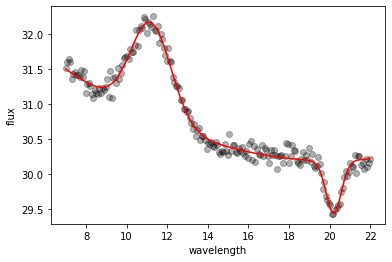

In [19]:
# We display our model
plt.scatter(w, f, color='black', alpha=0.3)
plt.plot(w, model_fit(w), color='red')
plt.xlabel("wavelength")
plt.ylabel("flux")
plt.show()

mean residue:  -3.6319924845429343e-12
1 $\sigma$ scatter:  0.0840297643882831


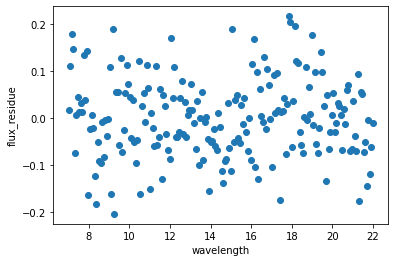

In [20]:
# display flux residue and get scatter. 

res = f - model_fit(w)

print("mean residue: ", np.mean(res))
print("1 $\sigma$ scatter: ", np.std(res))

plt.scatter(w, res)
plt.xlabel("wavelength")
plt.ylabel("flux_residue")

plt.show()

## Playing with images

**Q4.** You are given an image file "subaru_hsc_galaxies_i_band.fits" which looks something like this:

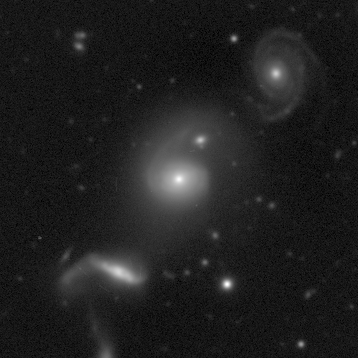

#### As you can see it has three diagonally arranged bright galaxies. You are supposed to read this image file and do the following:

**a)** Get the basic statistics of this image data by finding maximum, minimum, mean and standard deviation.

**b)** Are there negatives in this image? If yes, replace all the negatives by a very small positive number say 0.0001. Now display this image along with the ra,dec grid. You may use plt.imshow with norm=LogNorm() for the display. 

**c)** Find the ra,dec (in degrees) of the three diagonal galaxies. You may take the brightest pixel in the central region of these galaxies to represent their positions.

**d)** Find the angular separations of centres of galaxies from one another. Given that 1 pixel = 0.167 arc seconds. What values you get if you translate the angular distances into physical distance?  You will need astropy.cosmology() for this convertion and the redshift of these galaxies. Assume all three of them have redshift z = 0.01.

###  -----------------------------------------------------------------------------------------------------------------------

In [21]:
# load image file & read the data 

from astropy.io import fits
from matplotlib.colors import LogNorm

hdu_list = fits.open("subaru_hsc_galaxies_i_band.fits")
hdu_list.info()

data = hdu_list[1].data          # this is an array

# fine mean, std, amx and min 
print("mean: ", np.mean(data))
print("std dev: ", np.std(data))
print("max: ", np.max(data))
print("min: ", np.min(data))

Filename: subaru_hsc_galaxies_i_band.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      27   ()      
  1                1 ImageHDU        31   (358, 358)   float32   
  2                1 ImageHDU         5   ()      
  3                1 ImageHDU         5   ()      
mean:  0.31304908
std dev:  2.1934583
max:  129.80467
min:  -0.22290075


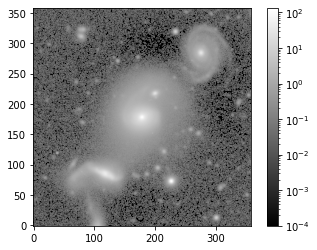

In [22]:
# there were negatives, we replace them by zero

data[data < 0] = 0        # replace all negatives by zero 

# add a small number and display image with LogNorm()

plt.imshow(data+0.0001, cmap='gray', norm=LogNorm(), origin='lower')
plt.colorbar()


In [23]:

# zooming into top right galaxy and obtaining location of bright pixel.----------------

gal1_data = data[250:300,250:300]
c1= np.where(gal1_data == np.amax(gal1_data))

c1x = 250+c1[1]
c1y = 250+c1[0]
#-------------------------------------------------

# same as above but for central galaxy -----------------------------

gal2_data = data[150:200,150:200]
c2= np.where(gal2_data == np.amax(gal2_data))

c2x = 150+c2[1]
c2y = 150+c2[0]
#-------------------------------------------------------------------

# Now for galaxy in botton left corner -----------

gal3_data = data[50:100,50:150]
c3= np.where(gal3_data == np.amax(gal3_data))

c3x = 50+c3[1]
c3y = 50+c3[0]
#-------------------------------------------------

print(c1x,c1y)
print(c2x,c2y)
print(c3x,c3y)

[276] [284]
[179] [178]
[118] [86]


In [24]:
# Using wcs convert pixel to sky positions (ra,dec)

from astropy.wcs import WCS

w = WCS(hdu_list[1].header)

c1_sky = w.pixel_to_world(c1x, c1y)          # here order should be in x,y
c2_sky = w.pixel_to_world(c2x, c2y) 
c3_sky = w.pixel_to_world(c3x, c3y) 

print(c1_sky, c2_sky, c3_sky)

<SkyCoord (ICRS): (ra, dec) in deg
    [(217.55389528, -0.83792184)]> <SkyCoord (ICRS): (ra, dec) in deg
    [(217.55842211, -0.84286871)]> <SkyCoord (ICRS): (ra, dec) in deg
    [(217.56126883, -0.84716216)]>


In [25]:
# ditance: 

# You can simply do this by finding separation in pixel space and then multiplying by 0.167(1 pixel=0.167 arcsec). 
# that is d21 = np.sqrt((c2x-c1x)**2 + (c2y-c1y)**2)*0.167
# this will be okay for small distances, but due to 3D geometry, sky.separaton() is recommended.  

d21 = c2_sky.separation(c1_sky).arcsecond[0]
d23 = c2_sky.separation(c3_sky).arcsecond[0]
d13 = c1_sky.separation(c3_sky).arcsecond[0]

print(d21,d23,d13)

# compare this value with simple distances using plane geometry.

sd21 = np.sqrt((c2x-c1x)**2 + (c2y-c1y)**2)*(0.167)
sd23 = np.sqrt((c2x-c3x)**2 + (c2y-c3y)**2)*(0.167)
sd13 = np.sqrt((c1x-c3x)**2 + (c1y-c3y)**2)*(0.167)
print(sd21,sd23,sd13)

24.138620869581572 18.54462875261332 42.556356763641624
[23.99517462] [18.43440981] [42.30344374]


In [26]:
# How to know what 1 arcmin amounts to in kpc at certain redshift z? Use cosmo.kpc_proper_per_arcmin(z)

from astropy.cosmology import WMAP9 as cosmo

cosmo.kpc_proper_per_arcmin(0.01)

<Quantity 12.42882653 kpc / arcmin>

In [27]:
p_d21 = d21*(1/60)*cosmo.kpc_proper_per_arcmin(0.01).value
p_d23 = d23*(1/60)*cosmo.kpc_proper_per_arcmin(0.01).value
p_d13 = d13*(1/60)*cosmo.kpc_proper_per_arcmin(0.01).value

print(p_d21,p_d23,p_d13)

5.000245524714231 3.841466230765195 8.815426266696646


**Q5.** This problem requires you to make a pretty RGB image of galaxy M51 using your favourite Python based astronomy module. 

#### For this problem, you are required to dowload images of M51 taken by Hubble Space Telescope from the following links. 

Blue Channel: https://archive.stsci.edu/cgi-bin/hla/moreinfo.cgi?html=1&dataset=hlsp_heritage_hst_acs-wfc_m51_f435w_v1_drz&filename=hlsp_heritage_hst_acs-wfc_m51_f435w_v1_drz&level=5&spectral_elt=F435W&aperture=WFCENTER&mode=ACCUM&propid=10452&piname=Beckwith&detector=ACS/WFC&naxis=8600%2012200&output_size=256&szoom=1.000000&hrcmatch=1&target=M51-POS6&selected=1&format=FITS&title=heritage_hst_acs-wfc_m51%20ACS%2FWFC%20F435W%20(hlsp)%20M51-POS6&releasedate=-2208988800&daocat=&sexcat= 

Green Channel: https://archive.stsci.edu/cgi-bin/hla/moreinfo.cgi?html=1&dataset=hlsp_heritage_hst_acs-wfc_m51_f555w_v1_drz&filename=hlsp_heritage_hst_acs-wfc_m51_f555w_v1_drz&level=5&spectral_elt=F555W&aperture=WFCENTER&mode=ACCUM&propid=10452&piname=Beckwith&detector=ACS/WFC&naxis=8600%2012200&output_size=256&szoom=1.000000&hrcmatch=1&target=M51-POS6&selected=1&format=FITS&title=heritage_hst_acs-wfc_m51%20ACS%2FWFC%20F555W%20(hlsp)%20M51-POS6&releasedate=-2208988800&daocat=&sexcat=

Red Channel: https://archive.stsci.edu/cgi-bin/hla/moreinfo.cgi?html=1&dataset=hlsp_heritage_hst_acs-wfc_m51_f658n_v1_drz&filename=hlsp_heritage_hst_acs-wfc_m51_f658n_v1_drz&level=5&spectral_elt=F658N&aperture=WFCENTER&mode=ACCUM&propid=10452&piname=Beckwith&detector=ACS/WFC&naxis=8600%2012200&output_size=256&szoom=1.000000&hrcmatch=1&target=M51-POS6&selected=1&format=FITS&title=heritage_hst_acs-wfc_m51%20ACS%2FWFC%20F658N%20(hlsp)%20M51-POS6&releasedate=-2208988800&daocat=&sexcat=

**Please note you are supposed to download the FITS-science images (~400 MB each).**



In [28]:
# read the images

rhdu = fits.open("hlsp_heritage_hst_acs-wfc_m51_f658n_v1_drz_sci.fits")
rhdu.info()

ghdu = fits.open("hlsp_heritage_hst_acs-wfc_m51_f555w_v1_drz_sci.fits")
ghdu.info()

bhdu = fits.open("hlsp_heritage_hst_acs-wfc_m51_f435w_v1_drz_sci.fits")
bhdu.info()

Filename: hlsp_heritage_hst_acs-wfc_m51_f658n_v1_drz_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1690   (8600, 12200)   float32   
Filename: hlsp_heritage_hst_acs-wfc_m51_f555w_v1_drz_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1762   (8600, 12200)   float32   
Filename: hlsp_heritage_hst_acs-wfc_m51_f435w_v1_drz_sci.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1762   (8600, 12200)   float32   
